Image Segmentation for detecting brain tumor :

ANALYSIS STEPS :

1- Making Mask

2- Preparing data

3- Building U-net CNN model

4- Training the model

5-Evalutation Model on some training data

6-Evaluation model on the test data

STEP 1 : MAKING MASKS

In this project tumors in yes images are masks. 

Lets look at some masks and images:

In [1]:
import os
import cv2
import numpy as np

# Define paths to your dataset
data_dir = r"C:\Users\HP\Downloads\archive (6)"
image_dir = os.path.join(data_dir, "yes")  # Directory for images with tumors
mask_dir = os.path.join(data_dir, "masks")

# Create the masks directory if it doesn't exist
if not os.path.exists(mask_dir):
    os.makedirs(mask_dir)

# Function to create mask for a single image
def create_mask(image_path):
    # Read the MRI image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Perform image processing and segmentation to generate the mask
    # Here you would implement your specific algorithm for segmentation
    
    # For example, you might use thresholding
    threshold_value = 127  # Example threshold value
    _, thresholded = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)
    
    # Or you might use more advanced techniques like deep learning-based segmentation
    
    # Save the generated mask
    mask_filename = os.path.basename(image_path).replace(".jpg", "_mask.jpg")  # Adjust extension if necessary
    mask_path = os.path.join(mask_dir, mask_filename)
    cv2.imwrite(mask_path, thresholded)

# Iterate through each image in the dataset and generate masks
for image_name in os.listdir(image_dir):
    if image_name.endswith(".jpg"):  # Adjust extension if necessary
        image_path = os.path.join(image_dir, image_name)
        create_mask(image_path)

print("Masks created successfully.")

Masks created successfully.


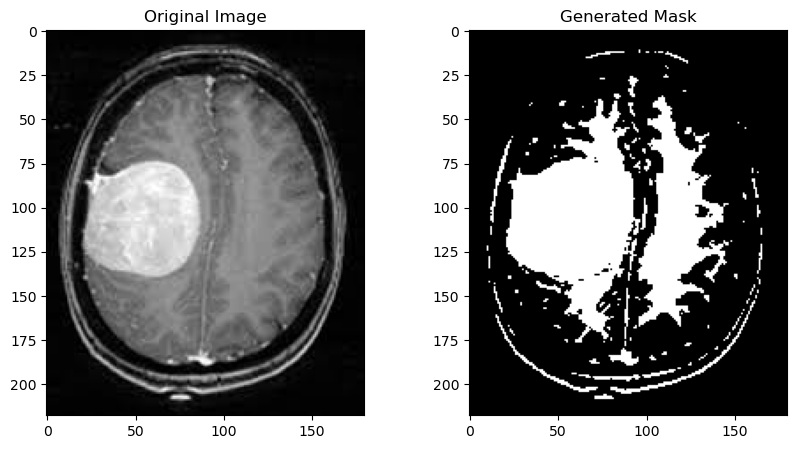

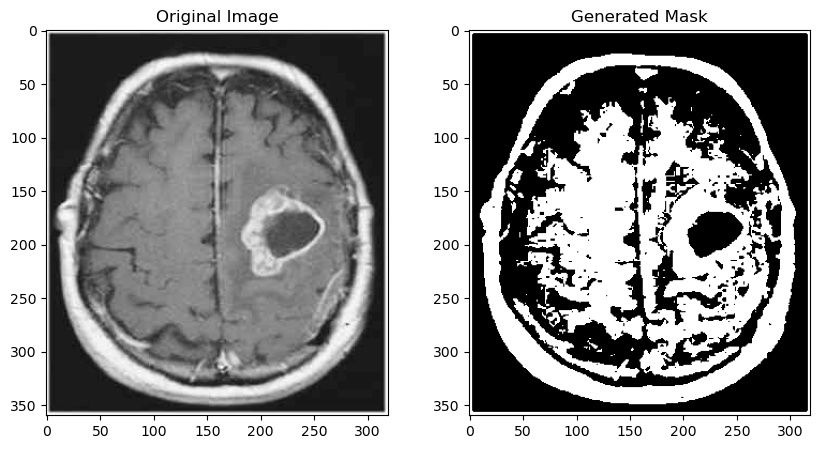

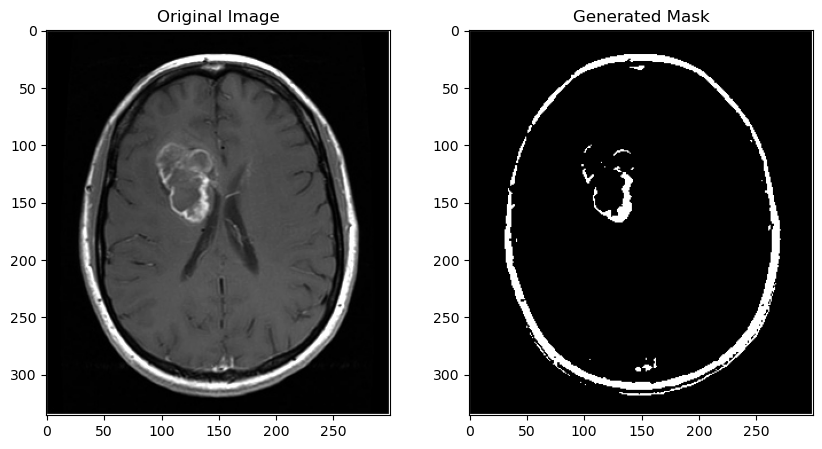

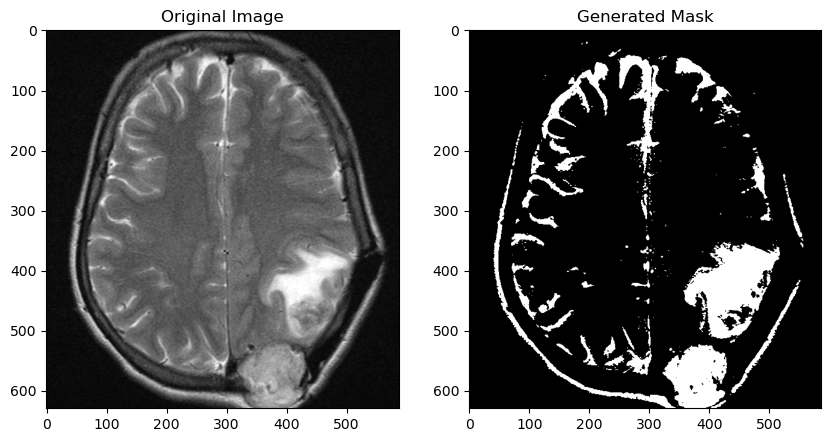

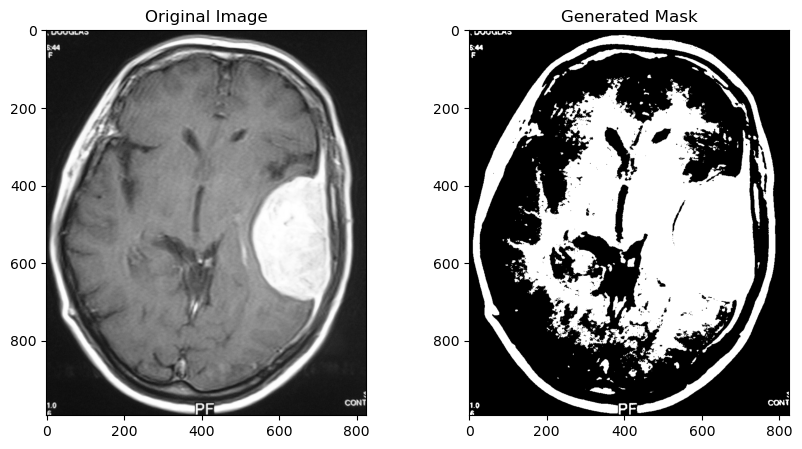

...

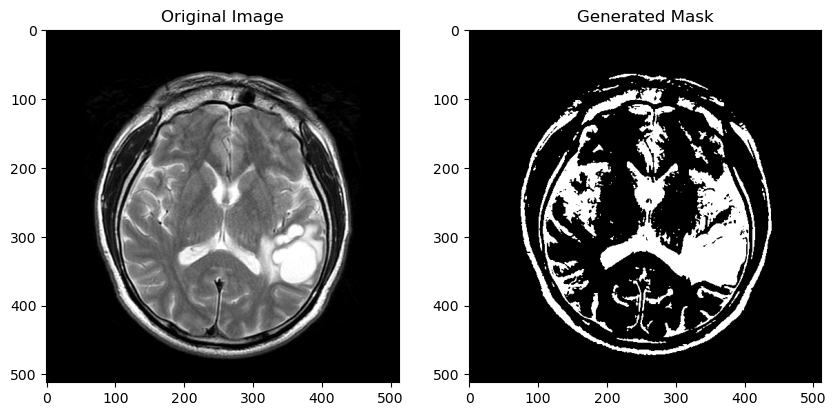

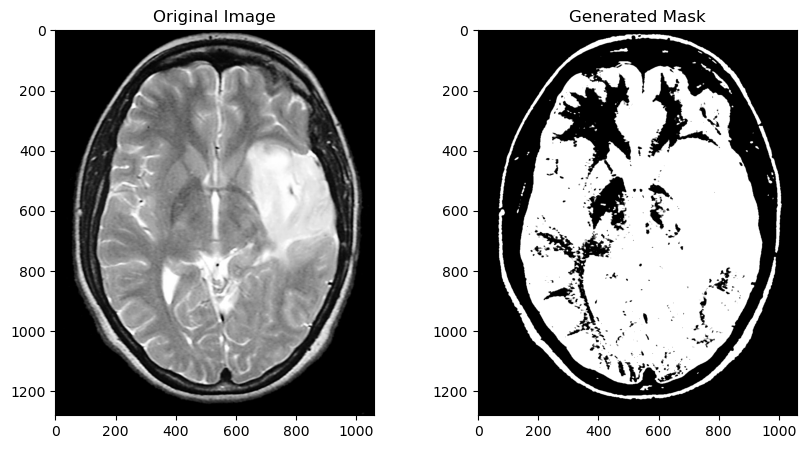

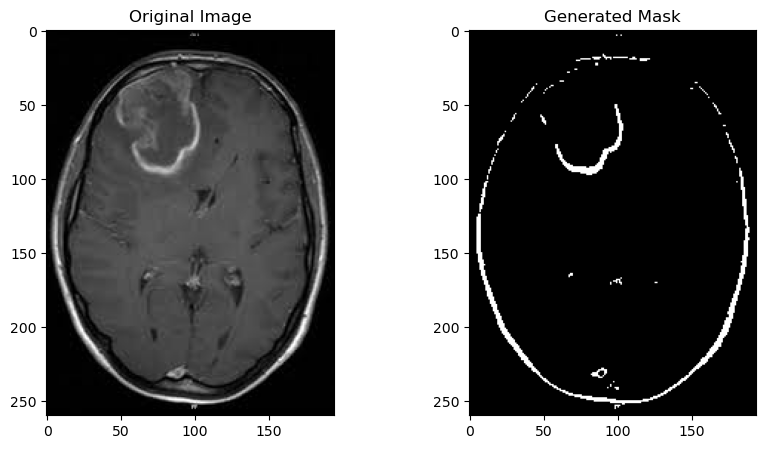

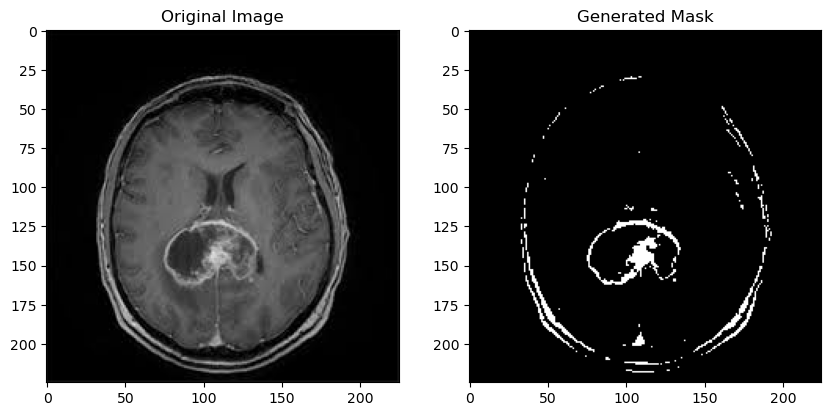

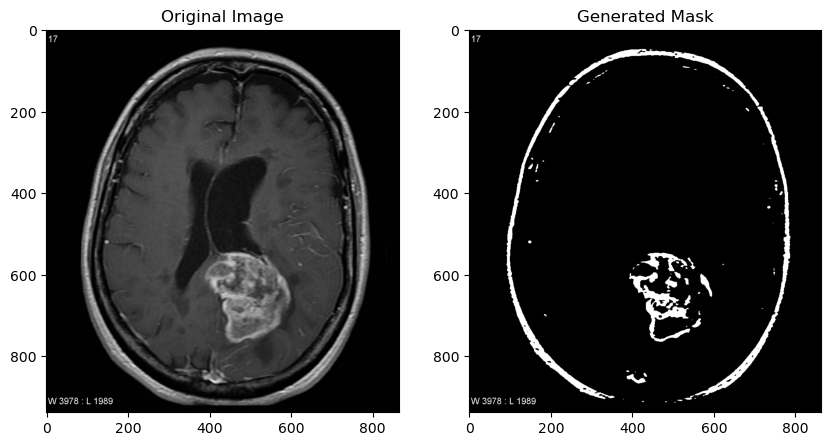

Masks created and visualized successfully.


In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define paths to your dataset
data_dir = r"C:\Users\HP\Downloads\archive (6)"
image_dir = os.path.join(data_dir, "yes")  # Directory for images with tumors
mask_dir = os.path.join(data_dir, "masks")

# Create the masks directory if it doesn't exist
if not os.path.exists(mask_dir):
    os.makedirs(mask_dir)

# Function to create mask for a single image
def create_mask(image_path):
    # Read the MRI image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Perform image processing and segmentation to generate the mask
    # Here you would implement your specific algorithm for segmentation
    
    # For example, you might use thresholding
    threshold_value = 127  # Example threshold value
    _, thresholded = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)
    
    # Or you might use more advanced techniques like deep learning-based segmentation
    
    # Save the generated mask
    mask_filename = os.path.basename(image_path).replace(".jpg", "_mask.jpg")  # Adjust extension if necessary
    mask_path = os.path.join(mask_dir, mask_filename)
    cv2.imwrite(mask_path, thresholded)

    return thresholded

# Iterate through each image in the dataset, generate masks, and plot the images with masks
for image_name in os.listdir(image_dir):
    if image_name.endswith(".jpg"):  # Adjust extension if necessary
        image_path = os.path.join(image_dir, image_name)
        mask = create_mask(image_path)
        
        # Plot the original image and its mask
        fig, axarr = plt.subplots(1, 2, figsize=(10, 5))
        original_image = cv2.imread(image_path)
        axarr[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axarr[0].set_title('Original Image')
        
        axarr[1].imshow(mask, cmap='gray')
        axarr[1].set_title('Generated Mask')
        
        plt.show()

print("Masks created and visualized successfully.")

STEP 2 : DATA PREPARATION 

In [3]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

# Define paths to your dataset
data_dir = r"C:\Users\HP\Downloads\archive (6)"
image_dir = os.path.join(data_dir, "yes")  # Directory for images with tumors
mask_dir = os.path.join(data_dir, "masks")

# Function to load and preprocess the data
def load_data(image_dir, mask_dir, image_size=(256, 256)):
    images = []
    masks = []
    for image_name in os.listdir(image_dir):
        if image_name.endswith(".jpg"):  # Adjust extension if necessary
            image_path = os.path.join(image_dir, image_name)
            mask_path = os.path.join(mask_dir, image_name.replace(".jpg", "_mask.jpg"))  # Adjust extension if necessary
            
            # Load and resize the image and mask
            image = cv2.imread(image_path)
            image = cv2.resize(image, image_size)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, image_size)
            
            # Normalize the image and mask
            image = image / 255.0
            mask = mask / 255.0
            
            images.append(image)
            masks.append(mask)
            
    return np.array(images), np.array(masks)

# Load the data
images, masks = load_data(image_dir, mask_dir)

# Split the data into training and validation sets
train_images, val_images, train_masks, val_masks = train_test_split(images, masks, test_size=0.2, random_state=42)

print("Data prepared successfully.")

Data prepared successfully.


Let's look at images and masks after preparation

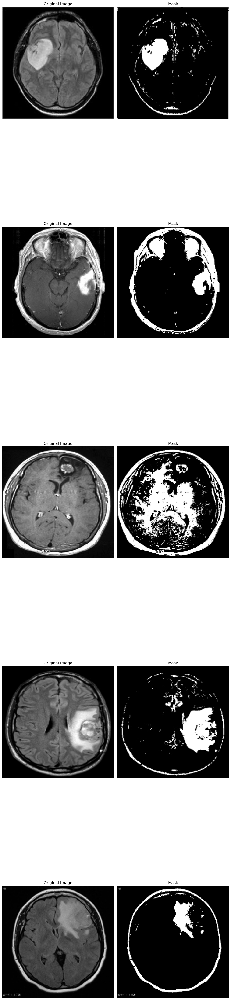

In [4]:
import matplotlib.pyplot as plt

# Function to display images and masks
def display_images_and_masks(images, masks, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 10*num_samples))
    for i in range(num_samples):
        # Display original image
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Display mask
        axes[i, 1].imshow(masks[i], cmap='gray')
        axes[i, 1].set_title('Mask')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Display some images and masks
num_samples = 5
display_images_and_masks(train_images[:num_samples], train_masks[:num_samples])

STEP 3 : BUILDING U-NET CNN MODEL

In [5]:
import sys
import random
import warnings #
import pandas as pd
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.morphology import label
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dropout, Lambda
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K
import tensorflow as tf

In [6]:
# Build U-Net model
# Note we make our layers varaibles so that we can concatenate or stack
# This is required so that we can re-create our U-Net Model

# Define image dimensions and channels
IMG_HEIGHT = 128
IMG_WIDTH = 128
IMG_CHANNELS = 3

inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs)

c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

# Note our output is effectively a mask of 128 x 128 
outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 128, 128, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ lambda (Lambda)               │ (None, 128, 128, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d (Conv2D)               │ (None, 128, 128, 16)      │             448 │ lambda[0][0]               │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout (Dropout)             │ (None, 128, 128, 16)      │               0 │ conv2d[0][0]               │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_1 (Conv2D)             │ (None, 128, 128, 16)      │           2,320 │ dropout[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d (MaxPooling2D)  │ (None, 64, 64, 16)        │               0 │ conv2d_1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_2 (Conv2D)             │ (None, 64, 64, 32)        │           4,640 │ max_pooling2d[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_1 (Dropout)           │ (None, 64, 64, 32)        │               0 │ conv2d_2[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 64, 64, 32)        │           9,248 │ dropout_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_1               │ (None, 32, 32, 32)        │               0 │ conv2d_3[0][0]             │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 32, 32, 64)        │          18,496 │ max_pooling2d_1[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_2 (Dropout)           │ (None, 32, 32, 64)        │               0 │ conv2d_4[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_5 (Conv2D)             │ (None, 32, 32, 64)        │          36,928 │ dropout_2[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_2               │ (None, 16, 16, 64)        │               0 │ conv2d_5[0][0]             │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_6 (Conv2D)             │ (None, 16, 16, 128)       │          73,856 │ max_pooling2d_2[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_3 (Dropout)           │ (None, 16, 16, 128)       │               0 │ conv2d_6[0][0]             │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 1,941,105 (7.40 MB)

 Trainable params: 1,941,105 (7.40 MB)

 Non-trainable params: 0 (0.00 B)

STEP 4 : TRAINING THE MODEL

In [90]:
!pip install tensorflow-gpu==1.14.0

In [91]:
import tensorflow as tf
print(tf.__version__)
tf.test.is_gpu_available() 

2.3.1


False

In [103]:
tf.compat.v1.disable_eager_execution()
model_path = "nuclei_finder_unet_1.h5"
# Initialize our callbacks

checkpoint = ModelCheckpoint(model_path,
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

earlystop = EarlyStopping(monitor = 'val_loss', 
                          min_delta = 0, 
                          patience = 5,
                          verbose = 1,
                          restore_best_weights = True)

# Fit our model 
results = model.fit(X_train, Y_train, validation_split=0.1,
                    batch_size=16, epochs=10,callbacks=[earlystop, checkpoint])



Train on 109 samples, validate on 13 samples
Epoch 1/10
109/109 [==============================] - ETA: 0s - loss: 0.4480 - accuracy: 0.8667
Epoch 00001: val_loss improved from inf to 0.29573, saving model to nuclei_finder_unet_1.h5
109/109 [==============================] - 16s 148ms/sample - loss: 0.4480 - accuracy: 0.8667 - val_loss: 0.2957 - val_accuracy: 0.9193
Epoch 2/10
109/109 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.9038
Epoch 00002: val_loss improved from 0.29573 to 0.20947, saving model to nuclei_finder_unet_1.h5
109/109 [==============================] - 10s 88ms/sample - loss: 0.3129 - accuracy: 0.9038 - val_loss: 0.2095 - val_accuracy: 0.9235
Epoch 3/10
109/109 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.9110
Epoch 00003: val_loss improved from 0.20947 to 0.18851, saving model to nuclei_finder_unet_1.h5
109/109 [==============================] - 10s 91ms/sample - loss: 0.2465 - accuracy: 0.9110 - val_loss: 0.1885 

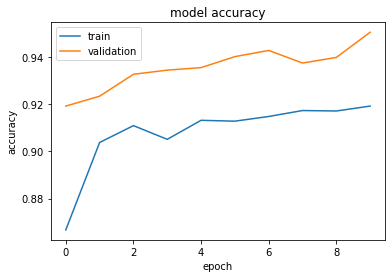

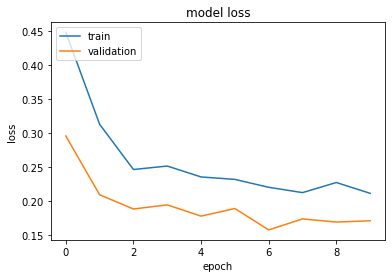

In [164]:
    plt.plot(results.history['accuracy'])
    plt.plot(results.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    # "Loss"
    plt.plot(results.history['loss'])
    plt.plot(results.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

STEP 5 : MODEL EVALUATION ON TRAINING DATA

Now let's look at the traing data evaluation :

In [104]:
model = load_model('nuclei_finder_unet_1.h5', 
                   custom_objects={'my_iou_metric': my_iou_metric})

# the first 90% was used for training
preds_train = model.predict(X_train[:int(X_train.shape[0]*0.9)], verbose=1)


#preds_test = model.predict(X_test, verbose=1)

# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)


Plotting the evalution of the data on the training set :

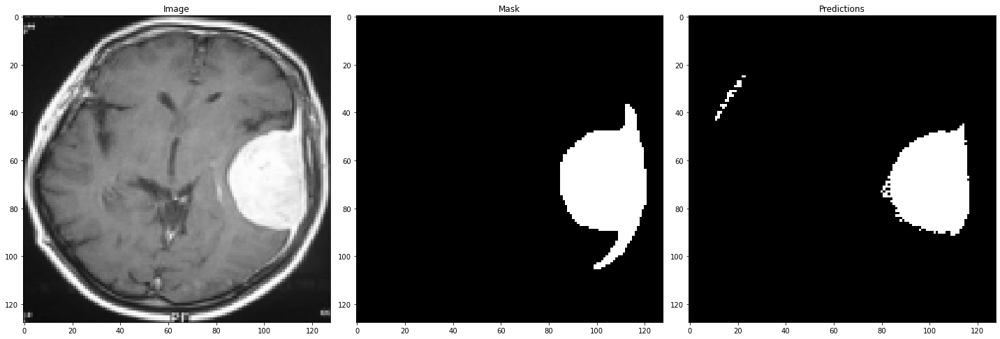

In [106]:
# Ploting our predicted masks
ix = random.randint(0, 120)
plt.figure(figsize=(20,20))

# Our original training image
plt.subplot(131)
imshow(X_train[ix])
plt.title("Image")

# Our original combined mask  
plt.subplot(132)
imshow(np.squeeze(Y_train[ix]))
plt.title("Mask")

# The mask our U-Net model predicts
plt.subplot(133)
imshow(np.squeeze(preds_train_t[ix] > 0.5))
plt.title("Predictions")
plt.show()

STEP 6 : MODEL EVALUATION ON TEST DATA

First let's evaluate the model on the test data (First we read test images from testData folder)

In [152]:
import os
import cv2
import numpy as np
data=[]
for dirname, _, filenames in os.walk('../input/testdata/test'):
    for filename in filenames:
        img=cv2.imread(os.path.join(dirname, filename))
        img=cv2.resize(img, dsize=(128, 128), interpolation=cv2.INTER_CUBIC)
        if img is not None:
                data.append(img)
        
data1=np.array(data)

Test data Prediction: 

In [153]:
preds_test = model.predict(data1, verbose=1)


#preds_test = model.predict(X_test, verbose=1)

# Threshold predictions
preds_test_t = (preds_train > 0.5).astype(np.uint8)

Test Data Evaluation:

In [154]:
preds_test = model.predict(data1, verbose=1)

preds_test_t = (preds_test > 0.5).astype(np.uint8)

Evaluation results and Plot :

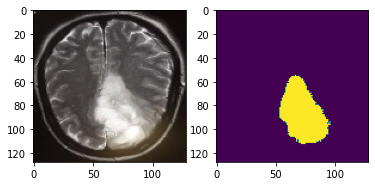

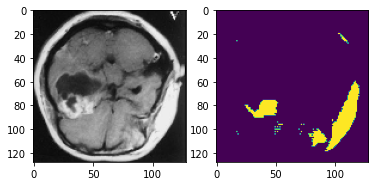

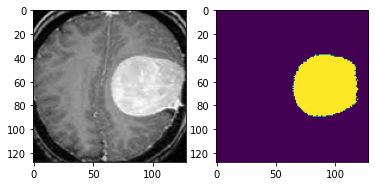

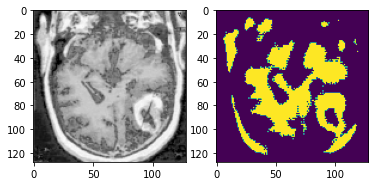

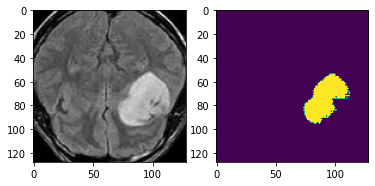

...

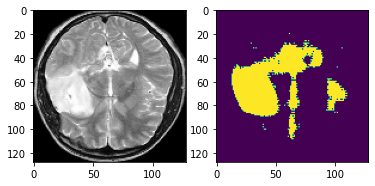

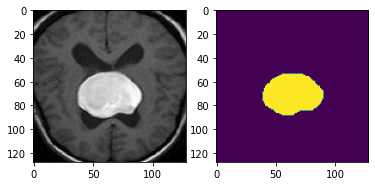

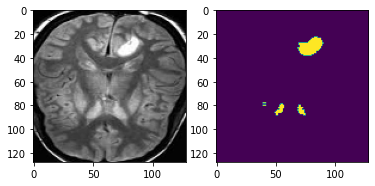

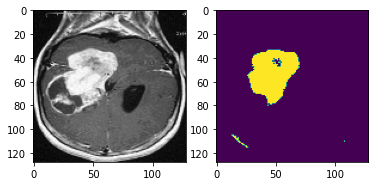

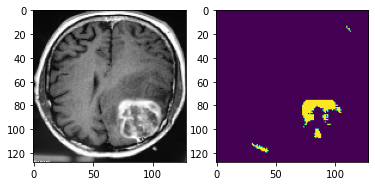

In [161]:
for n in range(len(data)):
    f = plt.figure()
    f.add_subplot(1,2, 1)
    plt.imshow(np.rot90(data[n],2))
    f.add_subplot(1,2, 2)
    plt.imshow(np.rot90(np.squeeze(preds_test_t[n]),2))
    plt.show(block=True)

Conclusion :
    
Using a U-net convolutional neural network (CNN) for image segmentation of brain tumors is a promising approach in medical imaging analysis. While the results may already be satisfactory on the test data, there's always room for improvement. One potential avenue for enhancement lies in refining the model itself. This can be achieved through various means, such as fine-tuning hyperparameters, adjusting the network architecture, or implementing more sophisticated loss functions. In particular, creating a custom accuracy function tailored to the specific nuances of brain tumor segmentation could lead to significant improvements. By designing an accuracy metric that accurately reflects the clinical relevance of correctly identifying tumor boundaries and distinguishing between tumor and healthy tissue, the model's performance could be enhanced. Additionally, incorporating techniques like data augmentation, ensemble learning, or transfer learning from related tasks could further boost the model's efficacy. Moreover, leveraging advanced optimization algorithms or exploring state-of-the-art deep learning architectures might uncover additional insights to refine the segmentation process. Continuous iteration and experimentation are crucial in the pursuit of maximizing the model's performance, ultimately contributing to more accurate and reliable diagnoses in clinical settings.